# Benchmark against other methods


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import pickle
import json
import seaborn as sns
import matplotlib.transforms as mtransforms
from bread import vis
import itertools
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from bread.algo import tracking
from bread.data import *
from sklearn.metrics import confusion_matrix
from pathlib import Path
from collections import defaultdict
from tqdm import tqdm
from glob import glob
import sys
import os.path
sys.path.append('../../src/libraries')  # import YeaZ

## Load testing data


In [4]:
seg = SegmentationFile.from_h5(
    '/mlodata1/hokarami/fari/bread/data/segmentations/colony006_segmentation.h5').get_segmentation("FOV0")
microscopy = Microscopy.from_tiff(
    '/mlodata1/hokarami/fari/bread/data/microscopies/colony006_microscopy.tif')
feat = Features(seg, nn_threshold=12, scale_length=1, scale_time=1)

# on average, first frame cells have an area of 2078.0 in the train set
mean_cell_area = 2078.0
area_list = []
cells_first_frame = seg.cell_ids(0)
for cell in cells_first_frame:
    area_list.append(feat.cell_area(0, cell))
scale = mean_cell_area / np.mean(area_list)
print(scale)
print(np.mean(area_list))
print(np.mean(area_list) * scale)
# replace features with correct scale
feat = Features(seg, nn_threshold=12, scale_length=scale, scale_time=1)

2.88410825815406
720.5
2078.0


In [5]:
max_dt = 4
interframes = [(idt, idt+dt) for idt, dt in itertools.product(
    range(len(seg)), range(1, max_dt+1)) if idt+dt < len(seg)]
print(f'{len(interframes)} interframe samples')

470 interframe samples


In [6]:
results = {'gcn': {}, 'yeaz': {}, 'tracx': {}}

In [7]:
recompute = True  # notebook flag to force recomputing the accuracies

In [8]:
# directory for results
basedir = Path('/mlodata1/hokarami/fari/bread/data/compare/colony_external')

## Our method (GCN)


In [11]:
modelpath = Path(
    '/Users/farzanehwork/Documents/codes/bread/data-clean/generated/tracking_cellFid1_edgeFid0_dist12/models/2023-07-20 14:06:19')

### Load model from pickle


In [12]:
with open(modelpath / 'pickle.pkl', 'rb') as file:
    net: tracking.AssignmentClassifier = pickle.load(file)

net.trim_for_prediction()
net

<class 'bread.algo.tracking._classifier.AssignmentClassifier'>[initialized](
  module_=GNNTracker(
    (node_encoder): MLP(16, 120, 120, 120, 120)
    (edge_encoder): MLP(10, 120, 120, 120, 120)
    (layers): ModuleList(
      (0-4): 5 x DeepGCNLayer(block=res+)
    )
    (out): MLP(120, 60, 30, 1)
  ),
)

In [13]:
dataset_cell_features = {
    0: ["area", "r_equiv", "r_maj", "r_min", "angle", "ecc"],  # default
    # with x and y coordinates
    1: ["area", "r_equiv", "r_maj", "r_min", "angle", "ecc", "x", "y"],
    2: ["area", "r_equiv", "r_maj", "r_min", "angle", "ecc", "age"],  # with age
    # with x and y coordinates and age
    3: ["area", "r_equiv", "r_maj", "r_min", "angle", "ecc", "x", "y", "age"],
}
dataset_edge_features = {
    0: ["cmtocm_x", "cmtocm_y", "cmtocm_len", "cmtocm_angle", "contour_dist",],  # default
    # with maj angle instead of angle
    1: ["cmtocm_x", "cmtocm_y", "cmtocm_len", "cmtocm_angle", "contour_dist", "majmaj_angle",],
}

In [14]:
ga = tracking.build_assgraph(tracking.build_cellgraph(
    feat, 50, cell_features=dataset_cell_features[1],
    edge_features=dataset_edge_features[0]),
    tracking.build_cellgraph(feat, 55, cell_features=dataset_cell_features[1],
                             edge_features=dataset_edge_features[0]), include_target_feature=True)
gat, *_ = tracking.to_data(ga)
yhat = net.predict_assignment(gat)
print(yhat)
yhat = yhat.flatten()
y = gat.y.squeeze().cpu().numpy()
confusion_matrix(y, yhat.flat)

[[1 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 0 1 0 0 0 0]
 [0 0 0 0 1 0 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 1]]


array([[56,  0],
       [ 0,  8]])

### Load model from params


In [ ]:
from bread.algo.tracking import GraphLoader, GNNTracker, InMemoryAssignmentDataset
from skorch.classifier import NeuralNetClassifier
import torch

with open(modelpath / 'hyperparams.json') as file:
    hparams = json.load(file)

# first initialize the model
new_net = NeuralNetClassifier(
    GNNTracker,
    module__num_node_attr=hparams['num_node_attr'],
    module__num_edge_attr=hparams['num_edge_attr'],
    module__dropout_rate=hparams['dropout_rate'],
    module__encoder_hidden_channels=hparams['encoder_hidden_channels'],
    module__encoder_num_layers=hparams['encoder_num_layers'],
    module__conv_hidden_channels=hparams['conv_hidden_channels'],
    module__conv_num_layers=hparams['conv_num_layers'],
    module__num_classes=1,
    iterator_train=GraphLoader,
    iterator_valid=GraphLoader,
    criterion=torch.nn.BCEWithLogitsLoss,
).initialize()
new_net.load_params(modelpath / 'params.pt')

dataset = InMemoryAssignmentDataset([
    tracking.to_data(tracking.build_assgraph(tracking.build_cellgraph(
        feat, 50), tracking.build_cellgraph(feat, 55), include_target_feature=True))[0]
])
# unactivated outputs
print(new_net.forward(dataset[0:1]).reshape(
    (len(dataset[0].cell_ids1), len(dataset[0].cell_ids2))))
# activated outputs
# WARNING : this is just applying a rounding operation, this is not the linear assignment !!
print(new_net.predict(dataset[0:1]).reshape(
    (len(dataset[0].cell_ids1), len(dataset[0].cell_ids2))))

tensor([[16.2810, -2.0827, -3.0145, -3.1012, -2.5568, -3.0371, -3.3175, -3.0224],
        [-2.0843, 21.3393, -2.8928, -2.8881, -3.1672, -2.9759, -2.7686, -3.0019],
        [-2.5924, -2.9989, 18.8732, -2.7159, -2.3742, -2.9616, -3.1065, -2.9696],
        [-2.9107, -3.0518, -2.4315, 16.3914, -3.0083, -2.9323, -2.4636, -2.9935],
        [-2.8790, -3.3396, -2.6361, -3.2003, 20.8592, -3.0238, -2.6432, -3.0317],
        [-3.0049, -3.0661, -2.7405, -3.1401, -3.1799, 19.3494, -2.9899, -2.7253],
        [-3.3158, -3.1957, -3.1720, -2.3336, -3.2470, -2.9167, 18.1181, -3.0416],
        [-3.2512, -3.2374, -3.1199, -3.3143, -3.1655, -2.0717, -3.1044, 18.4823]])
[[1 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 0 1 0 0 0 0]
 [0 0 0 0 1 0 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 1]]


### compute


In [15]:
if recompute:
    results['gcn'] = {
        't1': [],
        't2': [],
        'confusion': []
    }

    for idt1, idt2 in tqdm(interframes):
        ga = tracking.build_assgraph(
            tracking.build_cellgraph(
                feat,
                idt1,
                cell_features=dataset_cell_features[1],
                edge_features=dataset_edge_features[0]
            ),
            tracking.build_cellgraph(
                feat,
                idt2,
                cell_features=dataset_cell_features[1],
                edge_features=dataset_edge_features[0]),
            include_target_feature=True)
        gat, *_ = tracking.to_data(ga)

        yhat = net.predict_assignment(gat).flatten()
        y = gat.y.squeeze().cpu().numpy()

        results['gcn']['confusion'].append(confusion_matrix(y, yhat))
        results['gcn']['t1'].append(idt1)
        results['gcn']['t2'].append(idt2)

100%|██████████| 714/714 [04:18<00:00,  2.76it/s]


## YeaZ


In [9]:
import YeaZ.unet.hungarian as YeaZ_hung

In [10]:
import scipy.spatial.distance


def match_cellids_from_segs(segframe1: np.ndarray, segframe2: np.ndarray, eps=1e-6):
    # Matches cellids between two identical segmentations, which use different numberings
    seg1 = Segmentation(segframe1[None, ...], 'fov0')
    seg2 = Segmentation(segframe2[None, ...], 'fov0')
    cms1 = seg1.cms(0)
    cms2 = seg2.cms(0)

    # compare centers of masses
    dists = scipy.spatial.distance.cdist(cms1, cms2)
    matches = dists < eps
    idx1, idx2 = matches.nonzero()
    assert not len(idx2) < len(cms1), 'not all cells were matched'
    assert not len(idx2) > len(cms1), 'too many cells were matched'

    return idx2

In [10]:
recompute = True

In [11]:
if recompute:
    results['yeaz'] = {
        't1': [],
        't2': [],
        'confusion': []
    }

    for idt1, idt2 in tqdm(interframes):
        seg_hat = YeaZ_hung.correspondence(seg[idt1], seg[idt2])
        idmap2 = match_cellids_from_segs(seg[idt2], seg_hat)

        y = tracking.assignment_from_segmentation(seg, idt1, idt2)
        yhat = tracking.assignment_from_segmentation(seg, idt1, idt2)[
            :, idmap2]

        results['yeaz']['confusion'].append(
            confusion_matrix(y.flatten(), yhat.flatten()))
        results['yeaz']['t1'].append(idt1)
        results['yeaz']['t2'].append(idt2)

 97%|█████████▋| 455/470 [06:04<00:12,  1.25it/s]


KeyboardInterrupt: 

## TracX


In [9]:
# since tracx works with matlab, we need to export the data to a convenient format
# then run it via matlab
# then analyze the results

import tifffile

fileid2frameid = defaultdict(dict)
dowrite = False

for dt in range(1, max_dt+1):
    outdir = str(basedir / 'TracX/framediff{:02d}').format(dt)
    os.makedirs(outdir, exist_ok=True)
    fileid = 0
    for startframe in range(0, dt):
        for frameid in range(startframe, len(seg), dt):
            fileid2frameid[dt][fileid] = frameid
            if dowrite:
                tifffile.imsave(
                    f'{outdir}/mask_{fileid:03d}.tif', seg[frameid])
                tifffile.imsave(
                    f'{outdir}/phc_{fileid:03d}.tif', microscopy[frameid])
            fileid += 1

if dowrite:
    with open(basedir / 'TracX/fileid2frameid.json', 'w') as f:
        json.dump(fileid2frameid, f)

In [10]:
# run the tracking in matlab and generate results in basedir / TracX_results/ ...

In [11]:
dfs_tracx_res = []

for framediff in range(1, max_dt+1):
    filepath = basedir / \
        f'TracX_results/TrackingResults_framediff{framediff:02d}.txt'
    df = pd.read_csv(filepath, sep='\t', usecols=[
                     'cell_frame', 'cell_index', 'track_index'])
    df['frameid'] = df.cell_frame.map(lambda f: fileid2frameid[1][f-1])
    df.drop(columns='cell_frame', inplace=True)
    df['framediff'] = framediff
    dfs_tracx_res.append(df)

df_tracx_res = pd.concat(dfs_tracx_res)

In [19]:
df_tracx_res.loc[df_tracx_res.frameid == 111]

,cell_index,track_index,frameid,framediff
5803,1,1,111,1
5804,2,2,111,1
5805,3,3,111,1
5806,4,4,111,1
5807,5,5,111,1
...,...,...,...,...
6690,81,1014,111,4
6691,82,1015,111,4
6692,83,1016,111,4
6693,84,1017,111,4


In [25]:
df_tracx_res

,cell_index,track_index,frameid,framediff
0,1,1,0,1
1,2,2,0,1
2,3,3,0,1
3,1,1,1,1
4,2,2,1,1
...,...,...,...,...
8258,327,1192,119,4
8259,328,1274,119,4
8260,329,1275,119,4
8261,330,1276,119,4


In [27]:
df_tracx_res.loc[df_tracx_res['framediff'] == 4].iloc[8258]

cell_index      327
track_index    1192
frameid         119
framediff         4
Name: 8258, dtype: int64

In [35]:
if recompute:
    results['tracx'] = {
        't1': [],
        't2': [],
        'confusion': []
    }

    for _, group_framediff in df_tracx_res.groupby('framediff'):
        framediff = group_framediff.framediff.iloc[0]

        for (_, group1), (_, group2) in itertools.product(group_framediff.groupby('frameid'), repeat=2):
            idt1, idt2 = group1.frameid.iloc[0], group2.frameid.iloc[0]

            # loop only over idt -> idt+framediff
            if idt2 - idt1 != framediff or idt2 < idt1:
                continue

            ass_tracx = np.empty(
                (len(group1.cell_index), len(group2.cell_index)))
            ass = np.empty((len(group1.cell_index), len(group2.cell_index)))


            for idx1, idx2 in itertools.product(range(len(group1.cell_index)), range(len(group2.cell_index))):
                ass_tracx[idx1, idx2] = group1.track_index.iloc[idx1] == group2.track_index.iloc[idx2]
                # the input to TracX are segmentations where the cellids are already tracked correctly
                # so the tracking is just where the cell indices match
                ass[idx1, idx2] = group1.cell_index.iloc[idx1] == group2.cell_index.iloc[idx2]
                if(ass_tracx[idx1, idx2] != ass[idx1, idx2]):
                    print("good hazard")
            
            if(ass_tracx.sum() != ass.sum()):
                print("Hazard!")

            results['tracx']['confusion'].append(
                confusion_matrix(ass.flatten(), ass_tracx.flatten()))
            results['tracx']['t1'].append(idt1)
            results['tracx']['t2'].append(idt2)

In [1]:
results['tracx']

NameError: name 'results' is not defined

## Compare results


### Create results dataframe


In [23]:
resultsfile = basedir / 'results.csv'
# os.makedirs(basedir)
if recompute:
    dfs = []

    for method in results:
        res = pd.DataFrame(results[method])
        res['method'] = method
        dfs.append(res)

    res = pd.concat(dfs, ignore_index=True)

    num_cells = [len(seg.cell_ids(idt)) for idt in range(len(seg))]

    res['tp'] = res['confusion'].map(lambda c: c[1, 1])
    res['fp'] = res['confusion'].map(lambda c: c[0, 1])
    res['tn'] = res['confusion'].map(lambda c: c[0, 0])
    res['fn'] = res['confusion'].map(lambda c: c[1, 0])
    res['acc'] = (res['tp'] + res['tn']) / \
        (res['tp'] + res['fp'] + res['tn'] + res['fn'])
    res['f1'] = 2*res['tp'] / (2*res['tp'] + res['fp'] + res['fn'])
    res['num_cells1'] = res['t1'].map(lambda t: num_cells[int(t)])
    res['num_cells2'] = res['t2'].map(lambda t: num_cells[int(t)])
    res['timediff'] = 5 * (res['t2'] - res['t1'])
    res.drop(columns='confusion', inplace=True)
    # res.to_csv(resultsfile)

# else:
    # res = pd.read_csv(resultsfile, index_col=0)

In [24]:
res

,method,t1,t2,tp,fp,tn,fn,acc,f1,num_cells1,num_cells2,timediff
0,yeaz,0.0,1.0,3,0,6,0,1.000000,1.000000,3,3,5.0
1,yeaz,0.0,2.0,3,0,6,0,1.000000,1.000000,3,3,10.0
2,yeaz,0.0,3.0,3,0,6,0,1.000000,1.000000,3,3,15.0
3,yeaz,0.0,4.0,3,0,6,0,1.000000,1.000000,3,3,20.0
4,yeaz,1.0,2.0,3,0,6,0,1.000000,1.000000,3,3,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
920,tracx,111.0,115.0,83,1,14109,2,0.999789,0.982249,229,267,20.0
921,tracx,112.0,116.0,103,3,21290,4,0.999673,0.967136,237,279,20.0
922,tracx,113.0,117.0,113,6,28038,10,0.999432,0.933884,251,294,20.0
923,tracx,114.0,118.0,132,9,38295,12,0.999454,0.926316,262,310,20.0


### Sanity checks


In [25]:
res.groupby(['timediff', 'method'])[['acc']].count()

acc
timediff method     
5.0      tracx   119
         yeaz    114
10.0     tracx   118
         yeaz    114
15.0     tracx   117
         yeaz    114
20.0     tracx   116
         yeaz    113

In [26]:
res.groupby(['method', 'timediff'])[['acc']].mean()

acc
method timediff          
tracx  5.0       0.999969
       10.0      0.999845
       15.0      0.999367
       20.0      0.997800
yeaz   5.0       0.999987
       10.0      0.999764
       15.0      0.998990
       20.0      0.997604

In [29]:
res.loc[res.method == 'tracx'].loc[res.timediff == 5].loc[res.fp != 0]

,method,t1,t2,tp,fp,tn,fn,acc,f1,num_cells1,num_cells2,timediff
522,tracx,67.0,68.0,42,1,1977,1,0.999010,0.976744,43,47,5.0
554,tracx,99.0,100.0,143,1,21167,1,0.999906,0.993056,144,148,5.0
561,tracx,106.0,107.0,190,1,38008,1,0.999948,0.994764,191,200,5.0
572,tracx,117.0,118.0,292,1,90845,2,0.999967,0.994889,294,310,5.0
573,tracx,118.0,119.0,304,5,102295,6,0.999893,0.982229,310,331,5.0


In [28]:
res_sum = res.groupby(['timediff', 'method'])[
    ['f1', 'tp', 'fp', 'fn', 'tn', 'num_cells1', 'num_cells2']].sum()
res_sum['precision'] = res_sum['tp'] / (res_sum['tp'] + res_sum['fp'])
res_sum['recall'] = res_sum['tp'] / (res_sum['tp'] + res_sum['fn'])
res_sum['f1'] = 2*res_sum['tp'] / \
    (2*res_sum['tp'] + res_sum['fp'] + res_sum['fn'])
res_sum[['f1', 'precision', 'recall']]
# res_sum.to_csv(
#     '/Users/farzanehwork/Documents/results/tracking/colony005_compare.csv')
res_sum

f1    tp   fp   fn       tn  num_cells1  num_cells2  \
timediff method                                                              
5.0      tracx   0.998423  7916    9   16  1275670        7932        8260   
         yeaz    0.999693  6518    2    2   856866        6520        6779   
10.0     tracx   0.996455  7027   22   28  1134103        7622        8257   
         yeaz    0.995552  6491   29   29   890374        6520        7043   
15.0     tracx   0.981981  5695   80  129   938419        7328        8254   
         yeaz    0.972393  6340  180  180   925471        6520        7319   
20.0     tracx   0.946904  4182  179  290   724141        7049        8251   
         yeaz    0.920242  5769  500  500   889253        6269        7316   

                 precision    recall  
timediff method                       
5.0      tracx    0.998864  0.997983  
         yeaz     0.999693  0.999693  
10.0     tracx    0.996879  0.996031  
         yeaz     0.995552  0.995552  
15.0     tracx    0.986147  0.977850  
         yeaz     0.972393  0.972393  
20.0     tracx    0.958954  0.935152  
         yeaz     0.920242  0.920242

In [69]:
res.to_csv(
    '/Users/farzanehwork/Documents/results/tracking/colony005_compare_plain.csv')
res_sum.to_csv(
    '/Users/farzanehwork/Documents/results/tracking/colony005_compare_sum.csv')

### Evaluate CI & plot


In [68]:
from scipy.stats import bootstrap

In [61]:
def frac_perfect(col):
    return (col == 1.0).sum() / len(col)

In [62]:
def frac_perfect_ci(col):
    # we need to test this otherwise scipy complains about degeneracy
    if all(col == 1):
        return (1.0, 1.0)
    bs = bootstrap((col,), statistic=frac_perfect,
                   vectorized=False, random_state=0)
    return bs.confidence_interval.low, bs.confidence_interval.high


def mean_ci(col):
    if all(col == 1):
        return (1.0, 1.0)
    bs = bootstrap((col,), statistic=np.mean, vectorized=False, random_state=0)
    return bs.confidence_interval.low, bs.confidence_interval.high

In [63]:
res_agg = (res
           .groupby(['timediff', 'method'])
           [['acc']]
           .agg([frac_perfect, frac_perfect_ci, np.mean, mean_ci, np.median])
           .reset_index()
           )
res_agg[[('acc', 'frac_perfect_ci_lower'), ('acc', 'frac_perfect_ci_higher')]] = pd.DataFrame(
    res_agg[('acc', 'frac_perfect_ci')].tolist(), index=res_agg.index)
res_agg[[('acc', 'mean_ci_lower'), ('acc', 'mean_ci_higher')]] = pd.DataFrame(
    res_agg[('acc', 'mean_ci')].tolist(), index=res_agg.index)
res_agg.drop(columns=[('acc', 'mean_ci'),
             ('acc', 'frac_perfect_ci')], inplace=True)
res_agg

timediff method          acc                                         \
                   frac_perfect      mean median frac_perfect_ci_lower   
0         5    gcn     0.983333  0.999891    1.0              0.955556   
1         5  tracx     0.944134  0.999117    1.0              0.899441   
2         5   yeaz     0.983333  0.999856    1.0              0.955556   
3        10    gcn     0.977654  0.999885    1.0              0.944134   
4        10  tracx     0.842697  0.998544    1.0              0.784421   
5        10   yeaz     0.944134  0.995944    1.0              0.905028   
6        15    gcn     0.938202  0.999711    1.0              0.893258   
7        15  tracx     0.706215  0.996570    1.0              0.638418   
8        15   yeaz     0.898876  0.991994    1.0              0.848315   
9        20    gcn     0.909605  0.999583    1.0              0.858757   
10       20  tracx     0.625000  0.995003    1.0              0.551136   
11       20   yeaz     0.853107  0.991746    1.0              0.796610   

                                                        
   frac_perfect_ci_higher mean_ci_lower mean_ci_higher  
0                0.994444      0.999477       0.999988  
1                0.972067      0.996396       0.999832  
2                0.994444      0.999478       0.999983  
3                0.994413      0.999518       0.999980  
4                0.893258      0.995947       0.999360  
5                0.972067      0.980804       0.999744  
6                0.966292      0.999396       0.999863  
7                0.774011      0.993660       0.997919  
8                0.938202      0.973391       0.999454  
9                0.943503      0.999254       0.999766  
10               0.693182      0.992234       0.996581  
11               0.898305      0.972994       0.999253

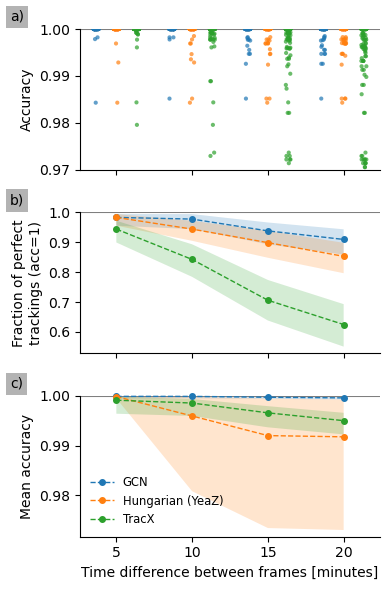

In [64]:
fig, axs = plt.subplot_mosaic([['a)'], ['b)'], ['c)']], figsize=(
    4, 6), sharex=True, tight_layout=True)

axs['b)'].axhline(1.0, color='tab:gray')
axs['b)'].fill_between(res_agg.timediff[res_agg.method == 'gcn'], res_agg.acc.frac_perfect_ci_lower[res_agg.method == 'gcn'], res_agg.acc.frac_perfect_ci_higher[res_agg.method == 'gcn'],
                       alpha=0.2)
axs['b)'].plot(res_agg.timediff[res_agg.method == 'gcn'], res_agg.acc.frac_perfect[res_agg.method == 'gcn'],
               'o--', markersize=4, linewidth=1,
               label='GCN', clip_on=False)
axs['b)'].fill_between(res_agg.timediff[res_agg.method == 'yeaz'], res_agg.acc.frac_perfect_ci_lower[res_agg.method == 'yeaz'], res_agg.acc.frac_perfect_ci_higher[res_agg.method == 'yeaz'],
                       alpha=0.2)
axs['b)'].plot(res_agg.timediff[res_agg.method == 'yeaz'], res_agg.acc.frac_perfect[res_agg.method == 'yeaz'],
               'o--', markersize=4, linewidth=1,
               label='Hungarian (YeaZ)', clip_on=False)
axs['b)'].fill_between(res_agg.timediff[res_agg.method == 'tracx'], res_agg.acc.frac_perfect_ci_lower[res_agg.method == 'tracx'], res_agg.acc.frac_perfect_ci_higher[res_agg.method == 'tracx'],
                       alpha=0.2)
axs['b)'].plot(res_agg.timediff[res_agg.method == 'tracx'], res_agg.acc.frac_perfect[res_agg.method == 'tracx'],
               'o--', markersize=4, linewidth=1,
               label='TracX', clip_on=False)
# axs['b)'].set_xlabel('Time difference between frames [minutes]')
axs['b)'].set_ylabel('Fraction of perfect\ntrackings (acc=1)')
axs['b)'].spines.top.set_visible(False)
axs['b)'].spines.right.set_visible(False)
# axs['b)'].legend(fontsize='small', frameon=False)
axs['b)'].set_ylim((None, 1.0))

axs['c)'].axhline(1.0, color='tab:gray')
axs['c)'].fill_between(res_agg.timediff[res_agg.method == 'gcn'], res_agg.acc['mean_ci_lower'][res_agg.method == 'gcn'], res_agg.acc['mean_ci_higher'][res_agg.method == 'gcn'],
                       alpha=0.2)
axs['c)'].plot(res_agg.timediff[res_agg.method == 'gcn'], res_agg.acc['mean'][res_agg.method == 'gcn'],
               'o--', markersize=4, linewidth=1,
               label='GCN', clip_on=False)
axs['c)'].fill_between(res_agg.timediff[res_agg.method == 'yeaz'], res_agg.acc['mean_ci_lower'][res_agg.method == 'yeaz'], res_agg.acc['mean_ci_higher'][res_agg.method == 'yeaz'],
                       alpha=0.2)
axs['c)'].plot(res_agg.timediff[res_agg.method == 'yeaz'], res_agg.acc['mean'][res_agg.method == 'yeaz'],
               'o--', markersize=4, linewidth=1,
               label='Hungarian (YeaZ)', clip_on=False)
axs['c)'].fill_between(res_agg.timediff[res_agg.method == 'tracx'], res_agg.acc['mean_ci_lower'][res_agg.method == 'tracx'], res_agg.acc['mean_ci_higher'][res_agg.method == 'tracx'],
                       alpha=0.2)
axs['c)'].plot(res_agg.timediff[res_agg.method == 'tracx'], res_agg.acc['mean'][res_agg.method == 'tracx'],
               'o--', markersize=4, linewidth=1,
               label='TracX', clip_on=False)
axs['c)'].set_ylabel('Mean accuracy')
axs['c)'].spines.top.set_visible(False)
axs['c)'].spines.right.set_visible(False)
axs['c)'].legend(fontsize='small', frameon=False)
axs['c)'].set_ylim((None, 1.0))
axs['c)'].set_xlabel('Time difference between frames [minutes]')

sns.stripplot(
    data=res, x='timediff', y='acc', hue='method',
    dodge=True, s=3, alpha=0.7, ax=axs['a)'], legend=False, native_scale=True,
    # clip_on=False,
)
axs['a)'].axhline(1.0, color='tab:gray')
# some outliers from YeaZ and trackx are not shown !!
axs['a)'].set_ylim((0.97, 1))
axs['a)'].set_ylabel('Accuracy')
axs['a)'].set_xlabel('Time difference between frames [minutes]')
axs['a)'].set_xticks(res_agg.timediff.unique())
axs['a)'].spines.top.set_visible(False)
axs['a)'].spines.right.set_visible(False)

for label, ax in axs.items():
    # label physical distance in and down
    trans = mtransforms.ScaledTranslation(-0.7, 0.05, fig.dpi_scale_trans)
    ax.text(0.0, 1.0, label, transform=ax.transAxes + trans,
            fontsize='medium', verticalalignment='bottom',
            bbox=dict(facecolor='0.7', edgecolor='none', pad=3.0))

# fig.savefig('../report_gnn/figures/timediff_accuracy.pdf')
plt.show()

### Evaluate p-value from bootstrapped samples


In [65]:
from typing import Callable
from scipy.stats import ttest_ind


def bootstrap_sample(
        x: np.ndarray,
        n: int = 10_000,
        agg: Callable[[np.ndarray], float] = np.mean
) -> np.ndarray:
    """Compute confidence interval of a given data aggregate

    Parameters
    ----------
    x : np.ndarray
            data
    alpha : float, optional
            size of the confidence interval, by default 0.95
    n : int, optional
            number of resamples, by default 1_000
    agg : Callable[[np.ndarray], float], optional
            aggregation function, by default np.mean

    Returns
    -------
    aggs: np.ndarray of length ``n``
    """

    aggs = np.zeros(n)

    for i in range(n):
        # resample data uniformly
        sample = x[np.random.randint(0, len(x), len(x))]
        aggs[i] = agg(sample)

    return np.sort(aggs)

-- timediff = 5 --
t-test gcn <-> tracx : Ttest_indResult(statistic=29.950694127446667, pvalue=1.5213959498906252e-99)
t-test gcn <-> yeaz : Ttest_indResult(statistic=-0.4642750805519542, pvalue=0.6427328752884681)
-- timediff = 10 --
t-test gcn <-> tracx : Ttest_indResult(statistic=62.53968867456741, pvalue=9.045044603295857e-195)
t-test gcn <-> yeaz : Ttest_indResult(statistic=19.29785538379993, pvalue=2.171365138328612e-57)
-- timediff = 15 --
t-test gcn <-> tracx : Ttest_indResult(statistic=79.03893842986643, pvalue=1.0537635159292797e-228)
t-test gcn <-> yeaz : Ttest_indResult(statistic=18.03780266411764, pvalue=3.365478340348986e-52)
-- timediff = 20 --
t-test gcn <-> tracx : Ttest_indResult(statistic=100.5845621915075, pvalue=1.4716601468623094e-264)
t-test gcn <-> yeaz : Ttest_indResult(statistic=21.909124573589974, pvalue=4.2489200051367416e-68)


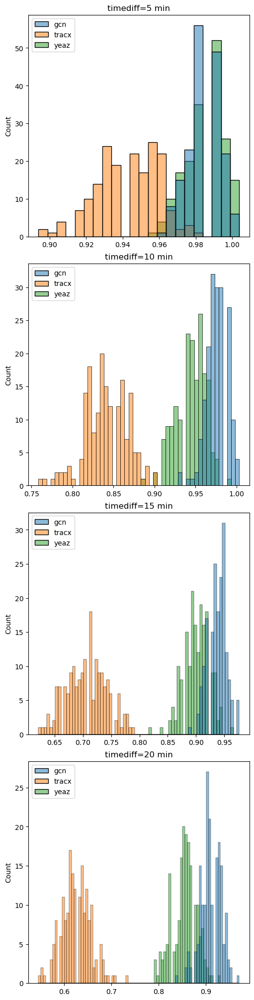

In [66]:
fig, axs = plt.subplots(nrows=res.timediff.nunique(),
                        figsize=(5, 20), constrained_layout=True)

for ax, timediff in zip(axs, res.timediff.unique()):
    print(f'-- timediff = {timediff} --')

    # we resample ~180 times because that's the number of datapoints we have
    sample_gcn = bootstrap_sample(res.query(
        'timediff == @timediff and method == "gcn"').acc.to_numpy(), n=180, agg=frac_perfect)
    sample_tracx = bootstrap_sample(res.query(
        'timediff == @timediff and method == "tracx"').acc.to_numpy(), n=180, agg=frac_perfect)
    sample_yeaz = bootstrap_sample(res.query(
        'timediff == @timediff and method == "yeaz"').acc.to_numpy(), n=180, agg=frac_perfect)

    sns.histplot(dict(gcn=sample_gcn, tracx=sample_tracx,
                 yeaz=sample_yeaz), binwidth=0.005, ax=ax)
    ax.set_title(f'timediff={timediff} min')

    print(f't-test gcn <-> tracx : {ttest_ind(sample_gcn, sample_tracx)}')
    print(f't-test gcn <-> yeaz : {ttest_ind(sample_gcn, sample_yeaz)}')

## What induces mistakes ?


Expected 1->1, got 1->2
Expected 2->2, got 2->1


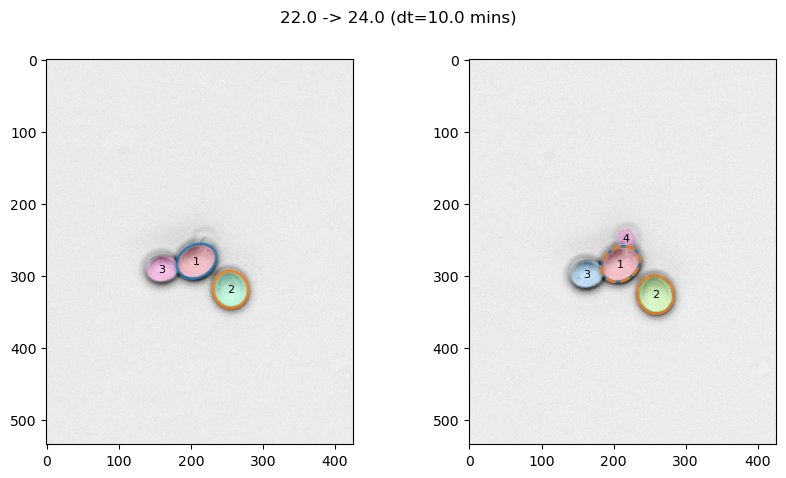

Expected 1->1, got 1->2
Expected 2->2, got 2->1


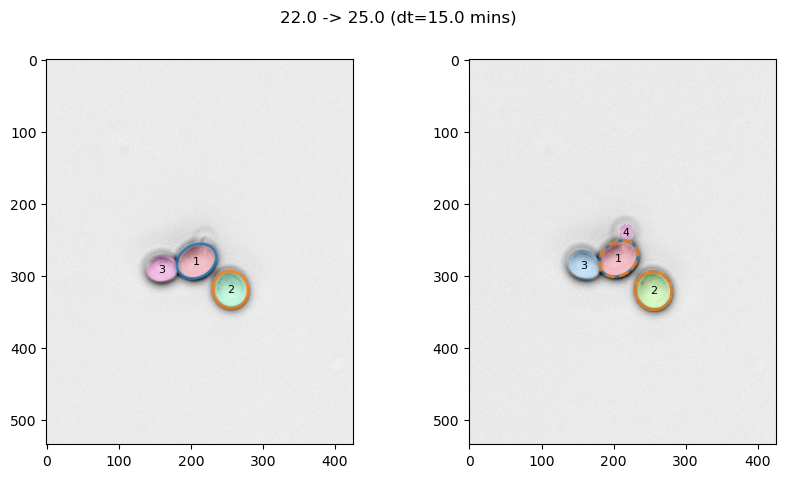

Expected 1->1, got 1->2
Expected 2->2, got 2->1


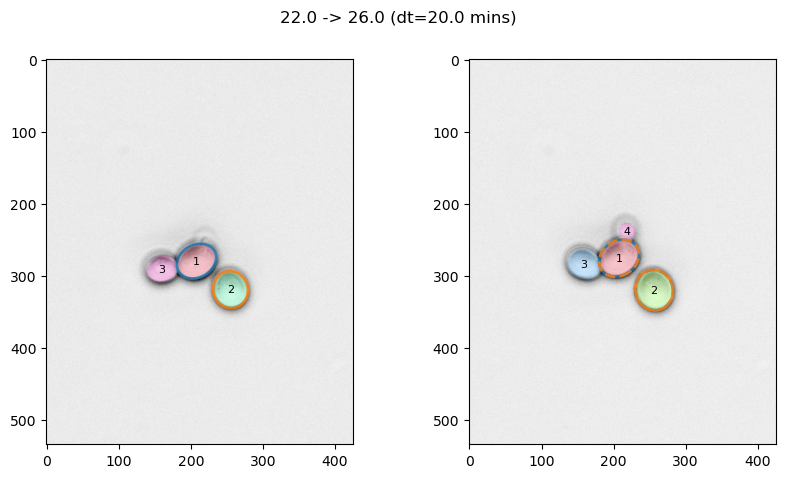

Expected 1->1, got 1->2
Expected 2->2, got 2->1


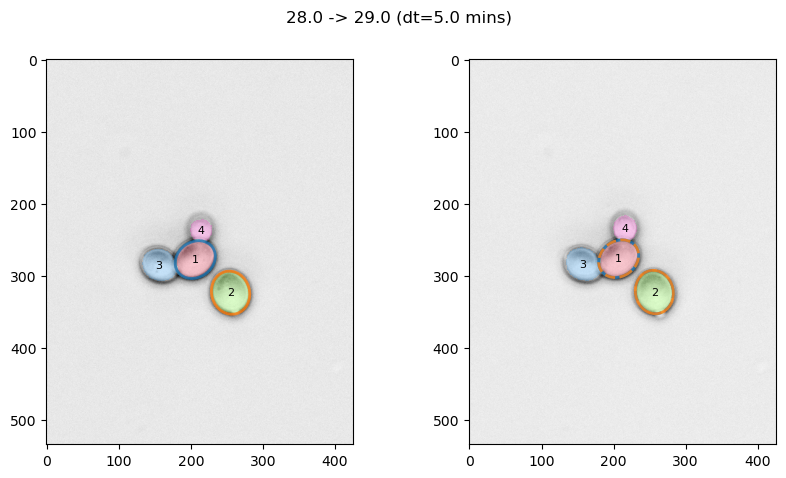

Expected 1->1, got 1->2
Expected 2->2, got 2->1


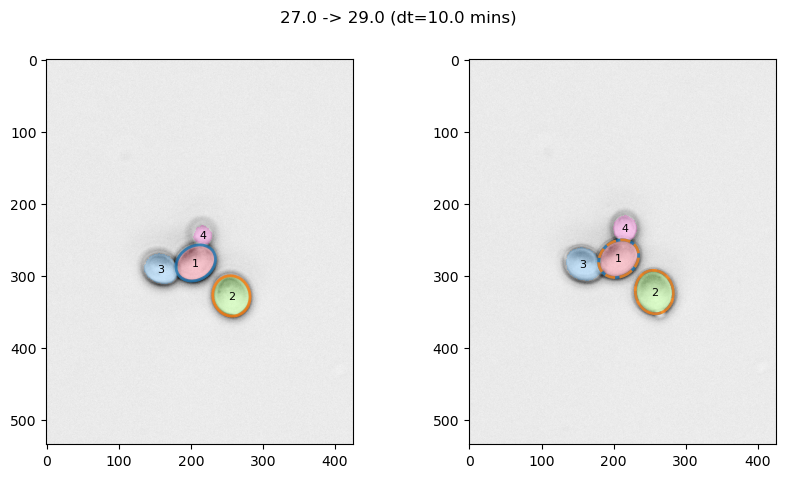

Expected 1->1, got 1->2
Expected 2->2, got 2->1


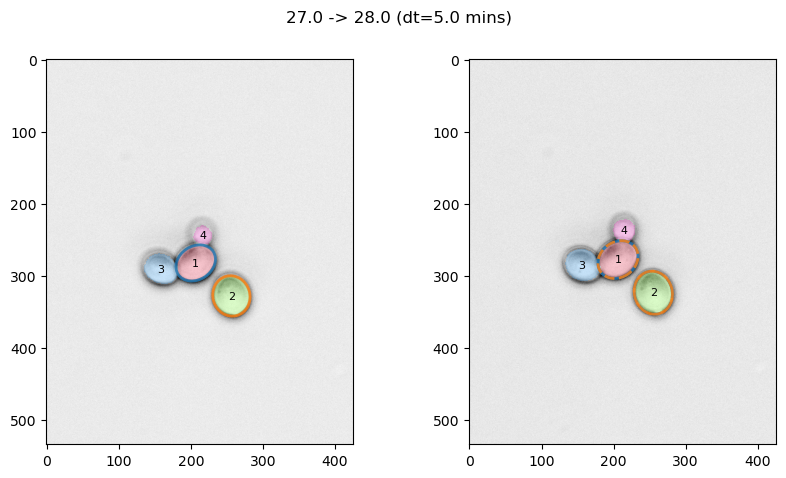

Expected 1->1, got 1->2
Expected 2->2, got 2->1


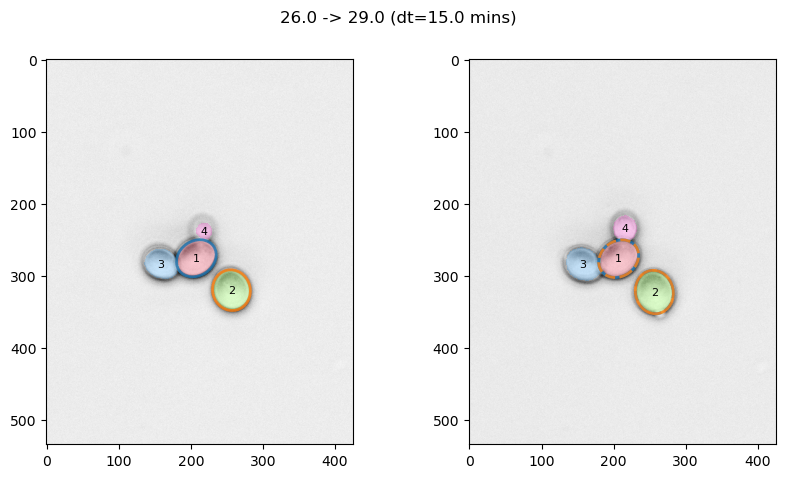

Expected 1->1, got 1->2
Expected 2->2, got 2->1


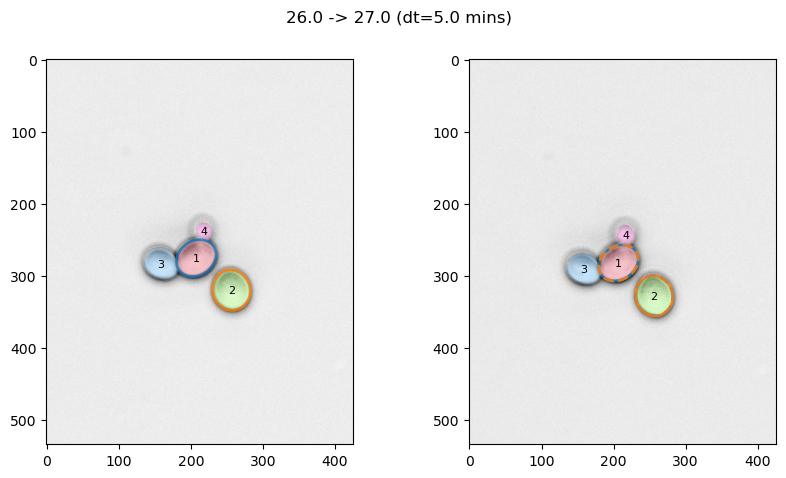

Expected 1->1, got 1->2
Expected 2->2, got 2->1


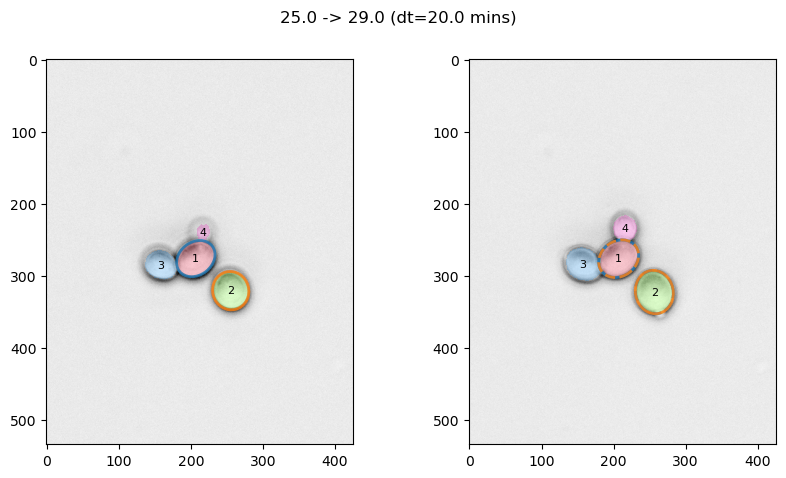

Expected 1->1, got 1->2
Expected 2->2, got 2->1


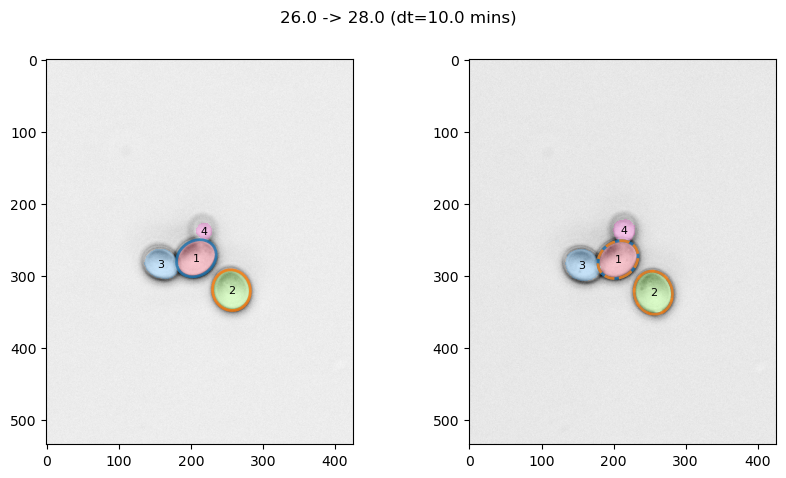

Expected 1->1, got 1->2
Expected 2->2, got 2->1


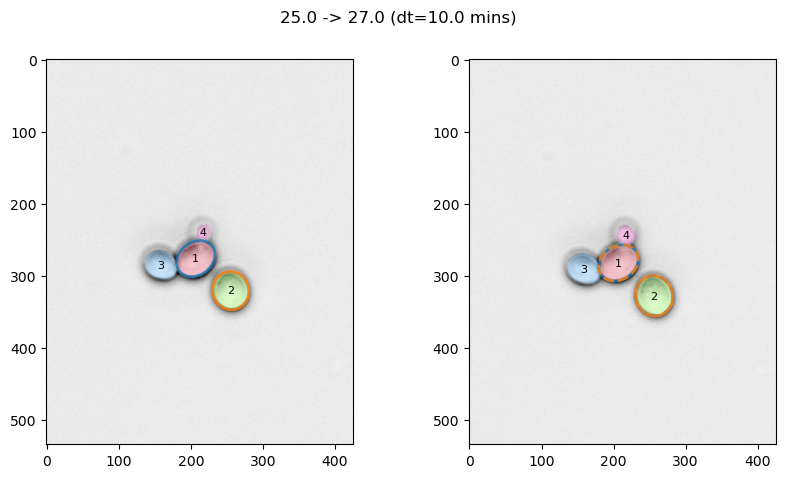

Expected 1->1, got 1->2
Expected 2->2, got 2->1


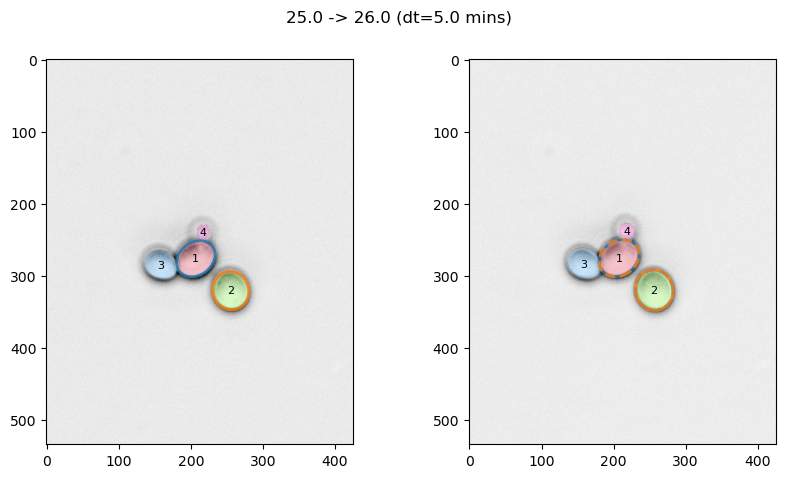

Expected 1->1, got 1->2
Expected 2->2, got 2->1


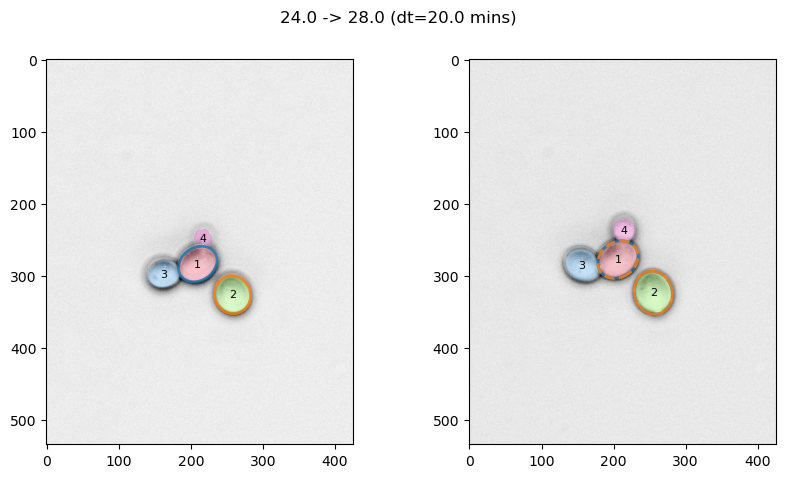

Expected 1->1, got 1->2
Expected 2->2, got 2->1


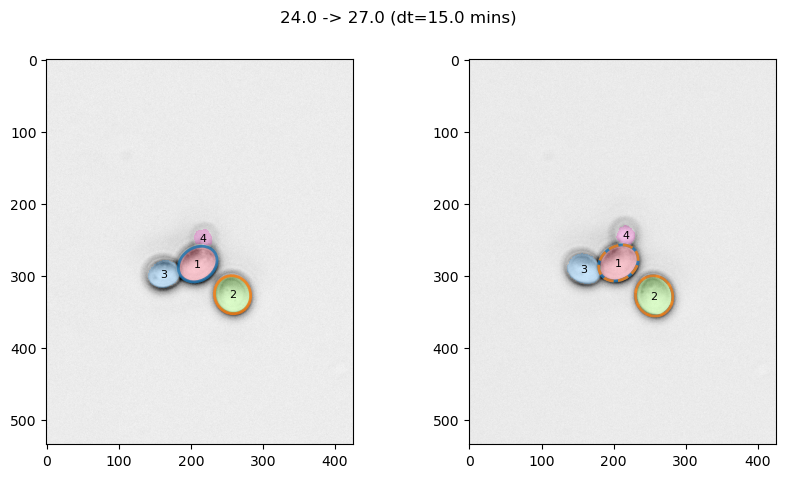

Expected 1->1, got 1->2
Expected 2->2, got 2->1


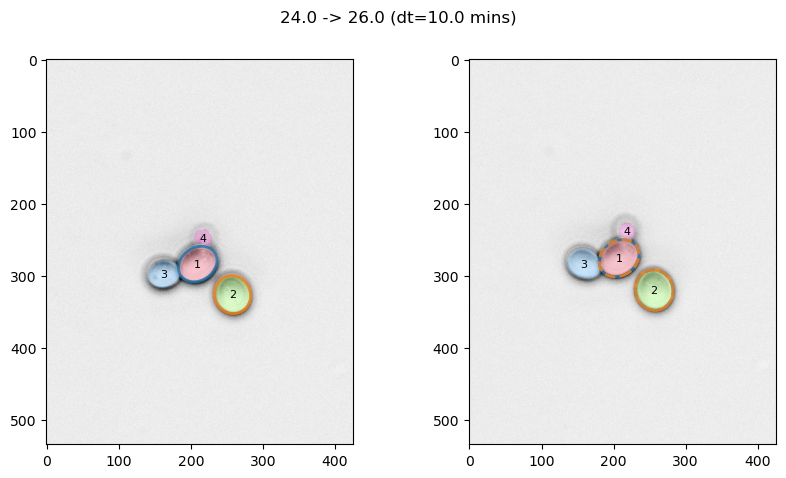

Expected 1->1, got 1->2
Expected 2->2, got 2->1


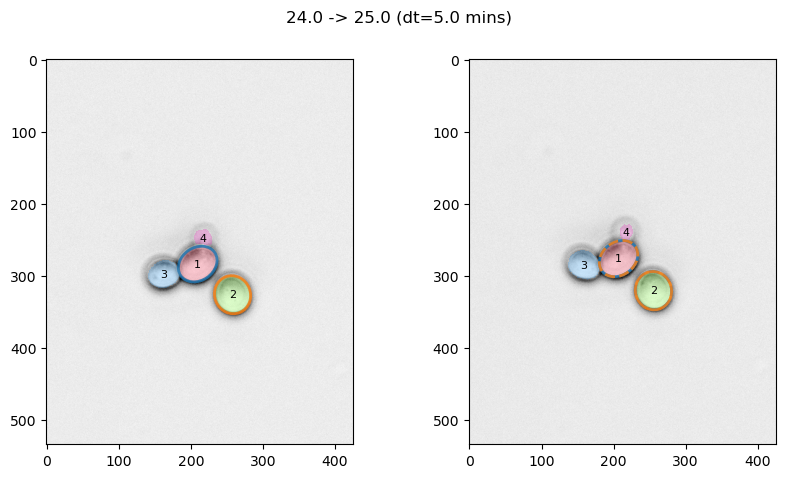

Expected 1->1, got 1->2
Expected 2->2, got 2->1


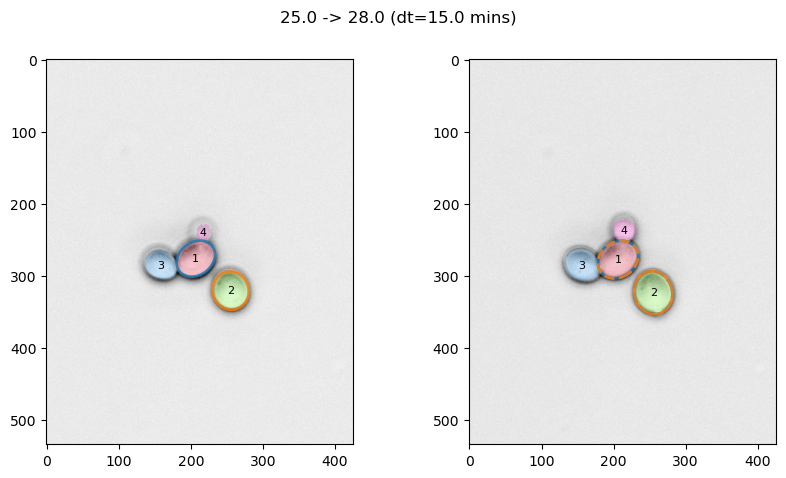

Expected 9->9, got 9->18


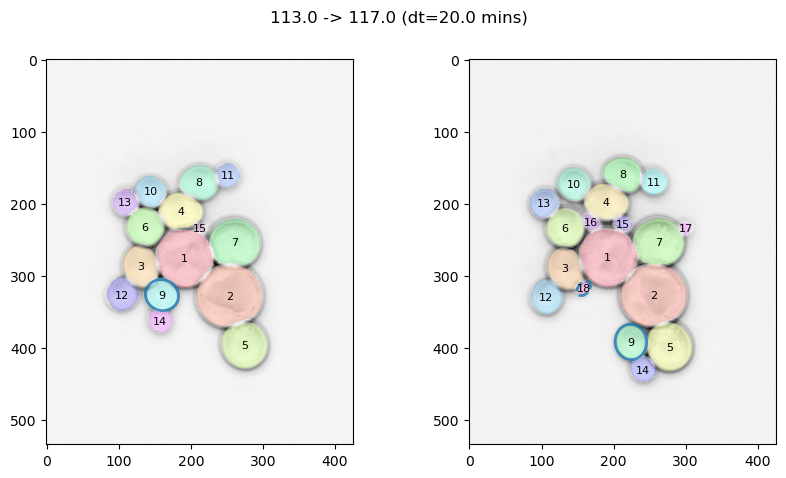

Expected 9->9, got 9->18


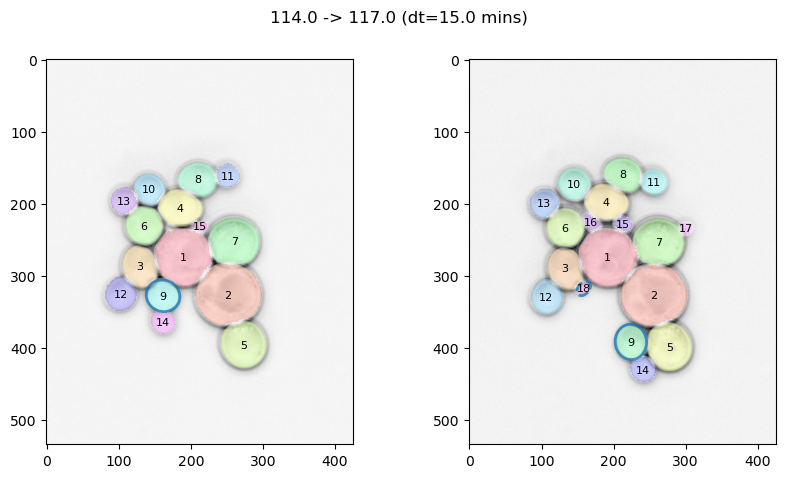

Expected 9->9, got 9->18


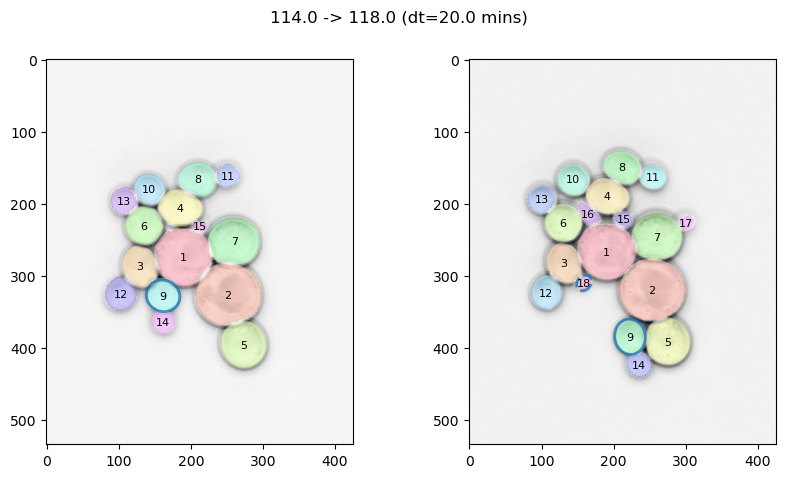

Expected 9->9, got 9->18


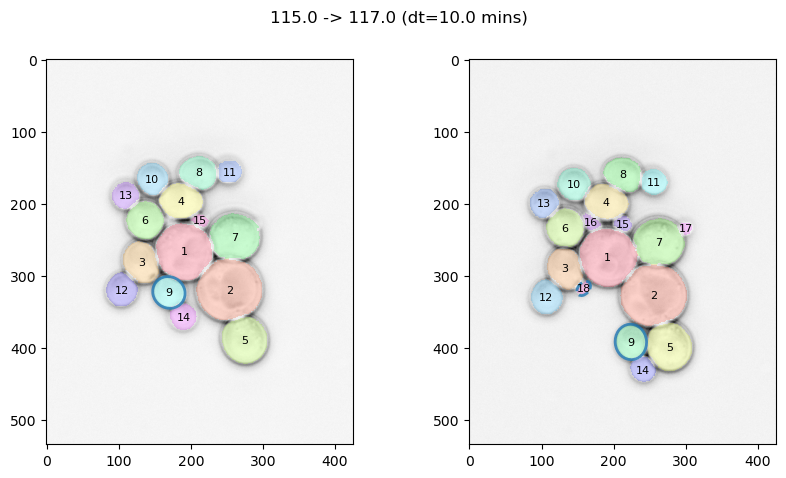

Expected 9->9, got 9->18


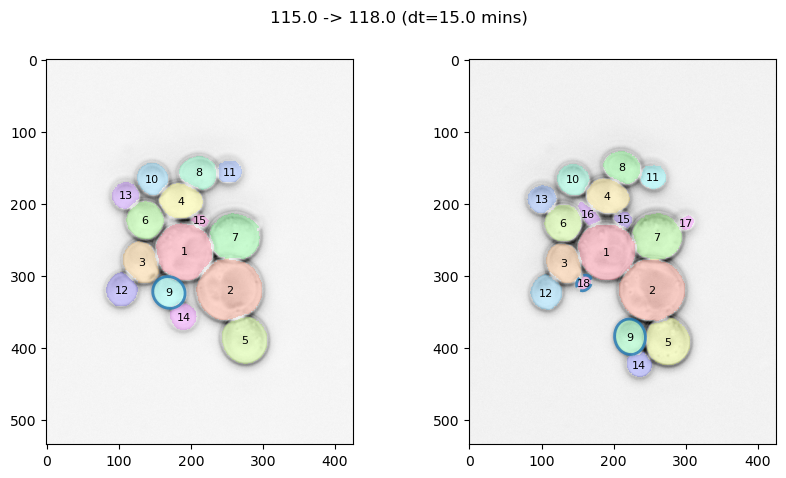

Expected 9->9, got 9->18


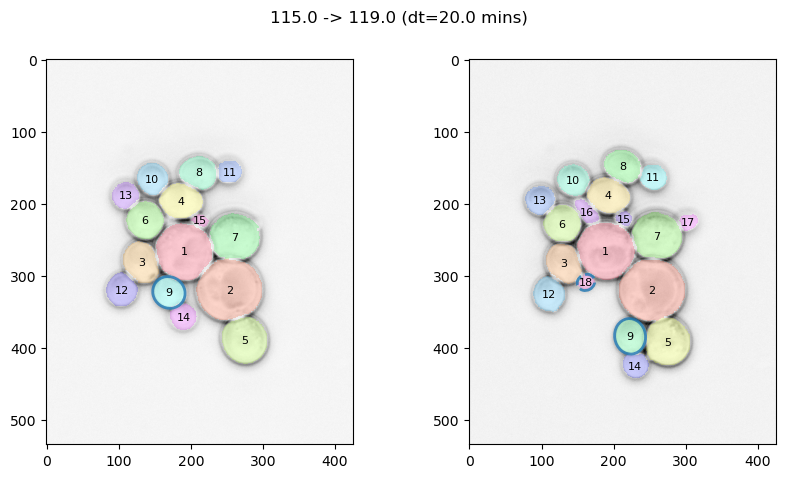

Expected 14->14, got 14->19


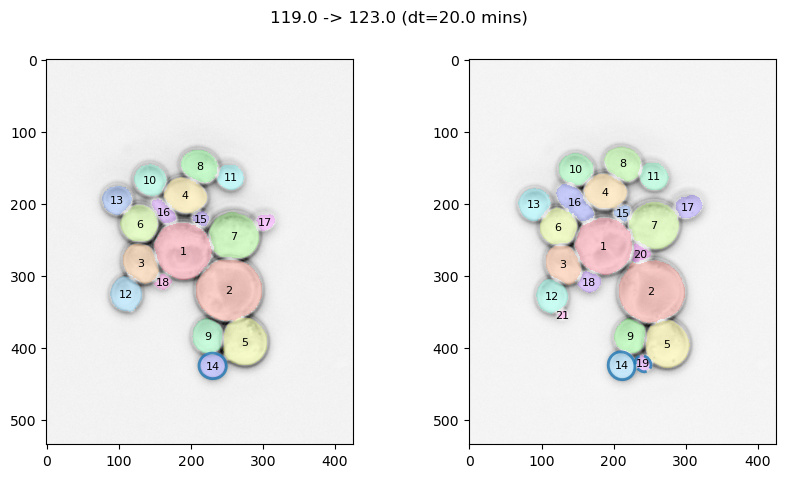

Expected 14->14, got 14->19


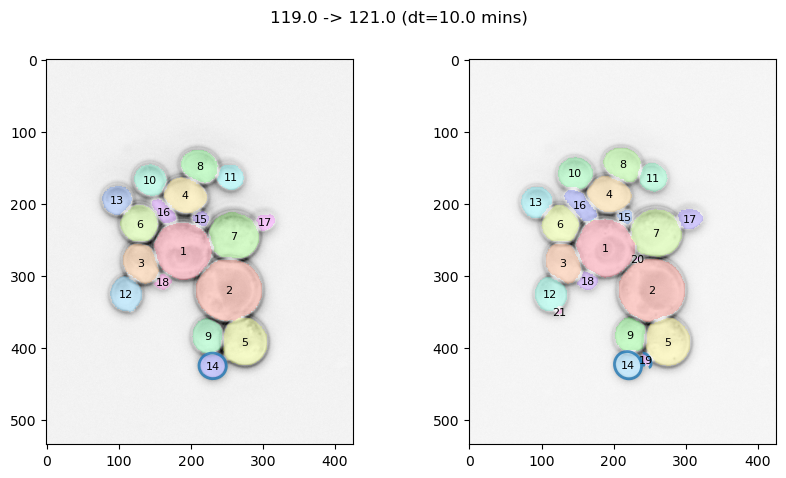

Expected 14->14, got 14->19


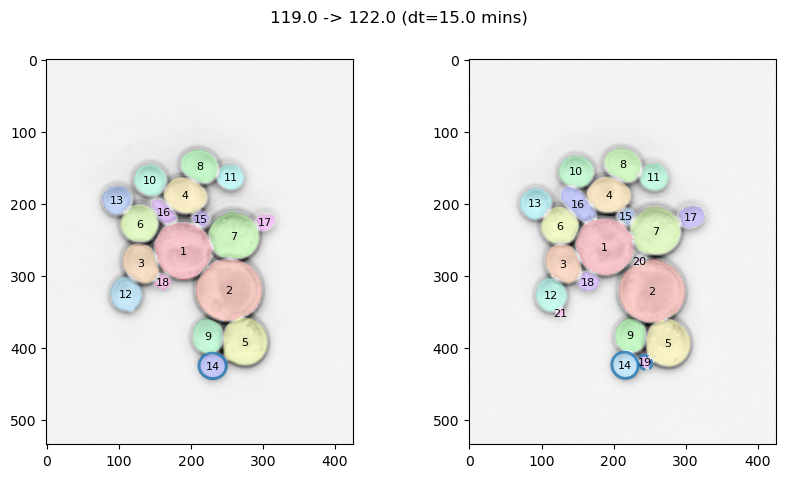

Expected 14->14, got 14->19


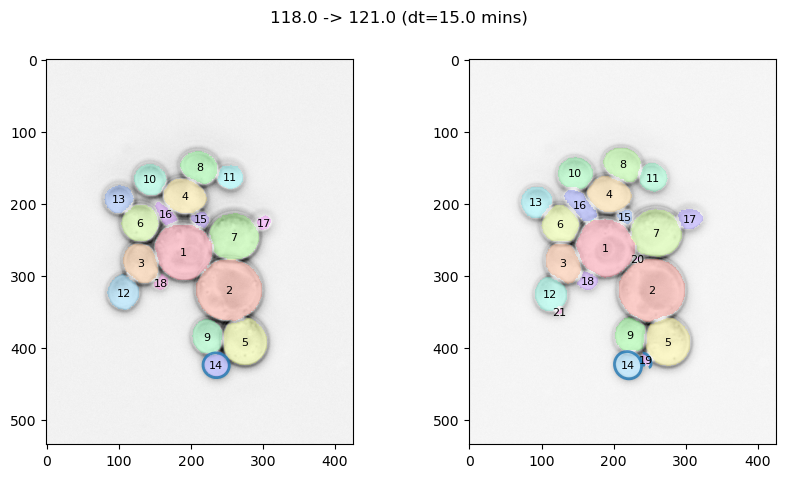

Expected 14->14, got 14->19


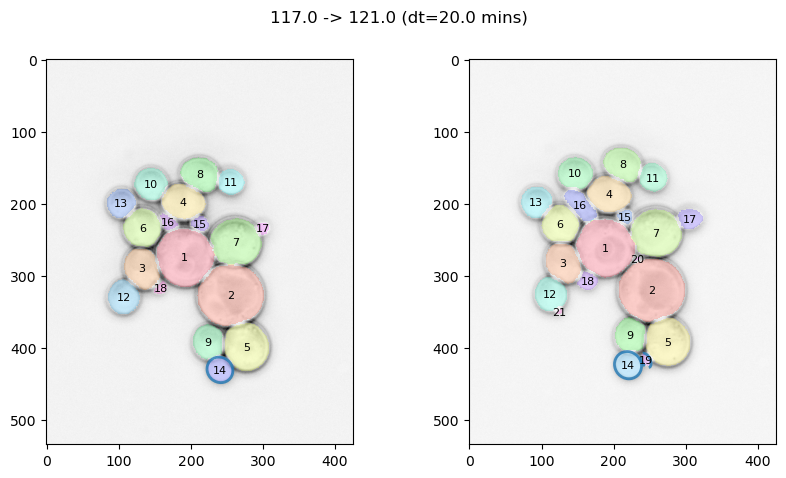

Expected 14->14, got 14->19


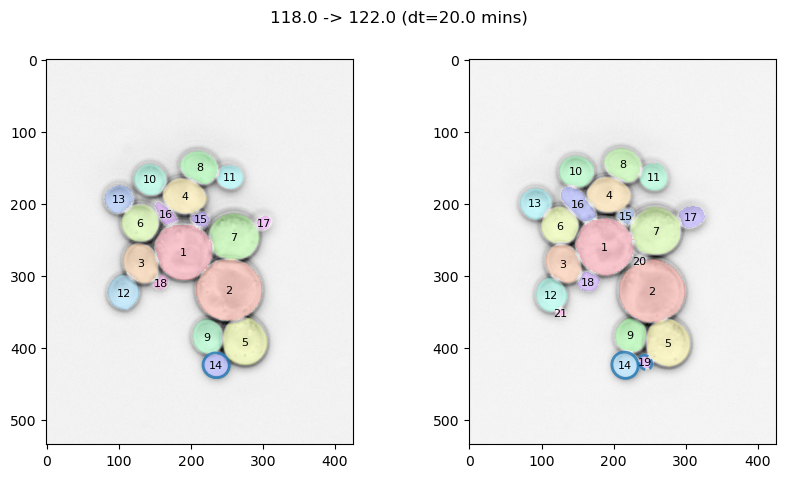

Expected 24->24, got 24->30
Expected 28->28, got 28->31


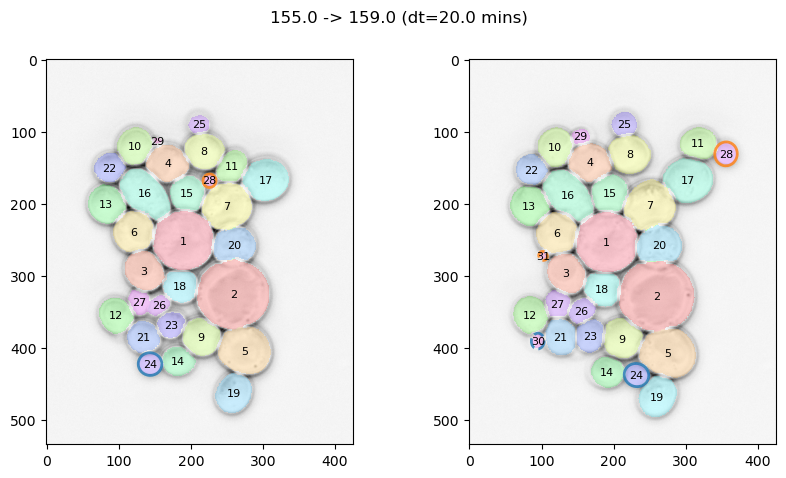

Expected 24->24, got 24->30
Expected 28->28, got 28->31


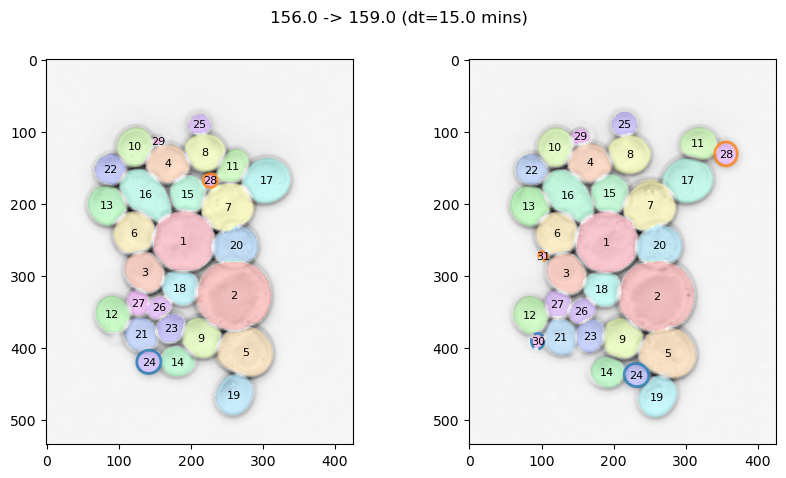

Expected 24->24, got 24->30
Expected 28->28, got 28->31


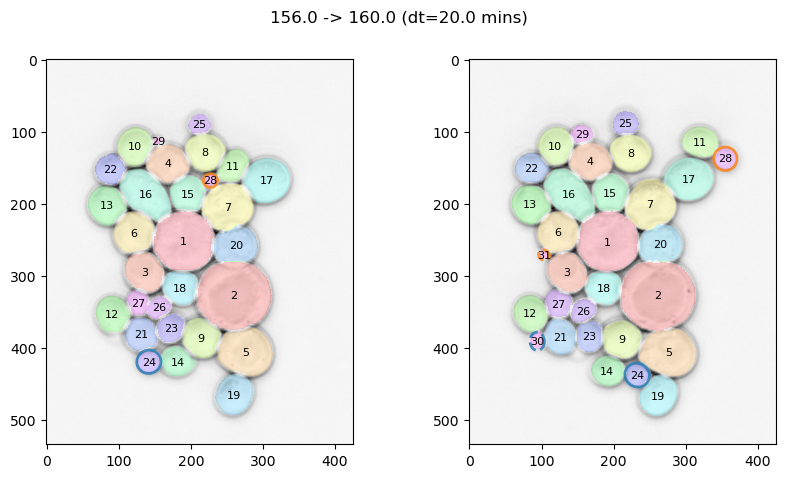

Expected 9->9, got 9->32
Expected 22->22, got 22->9


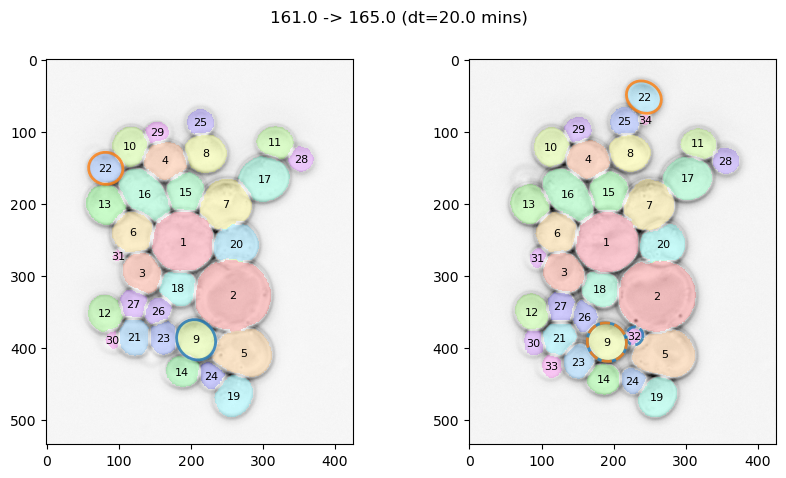

Expected 22->22, got 22->35
Expected 33->33, got 33->34


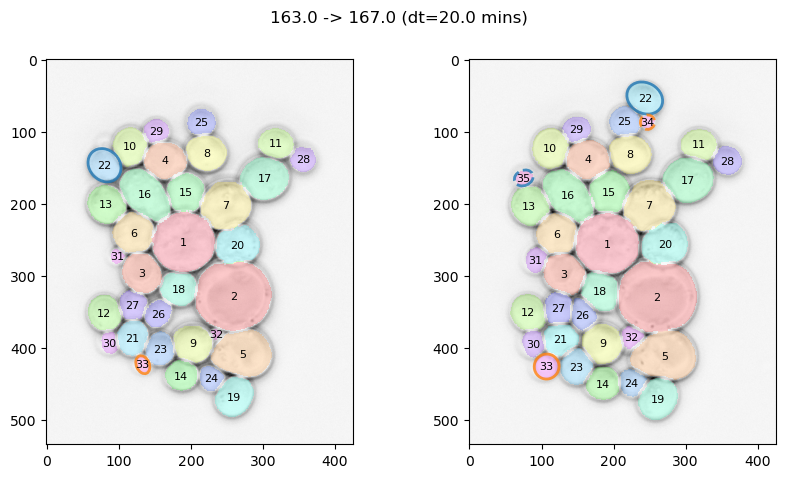

Expected 22->22, got 22->35
Expected 33->33, got 33->34


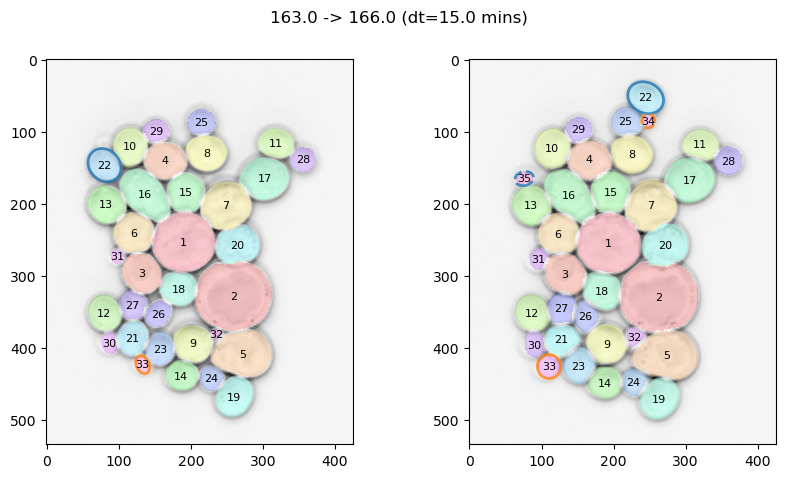

Expected 22->22, got 22->35
Expected 33->33, got 33->34


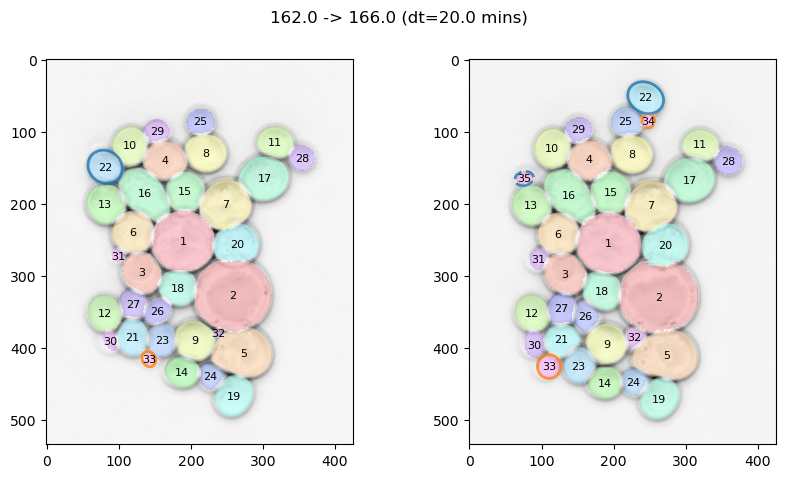

Expected 26->26, got 26->37
Expected 27->27, got 27->26


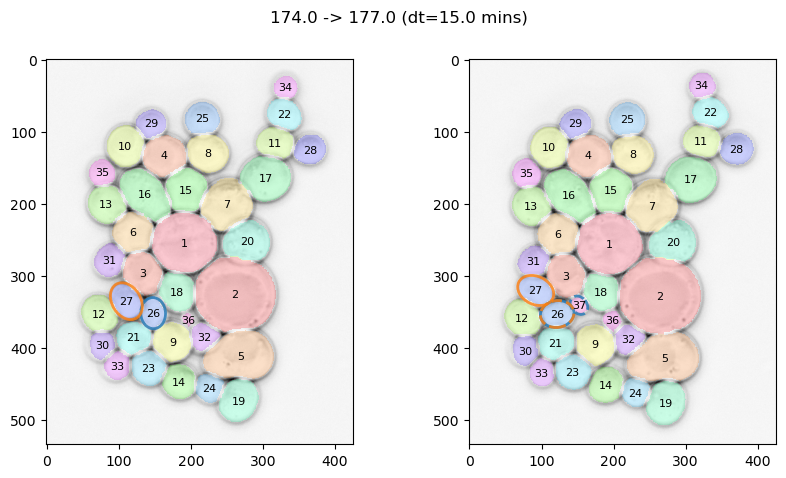

Expected 26->26, got 26->37
Expected 27->27, got 27->26


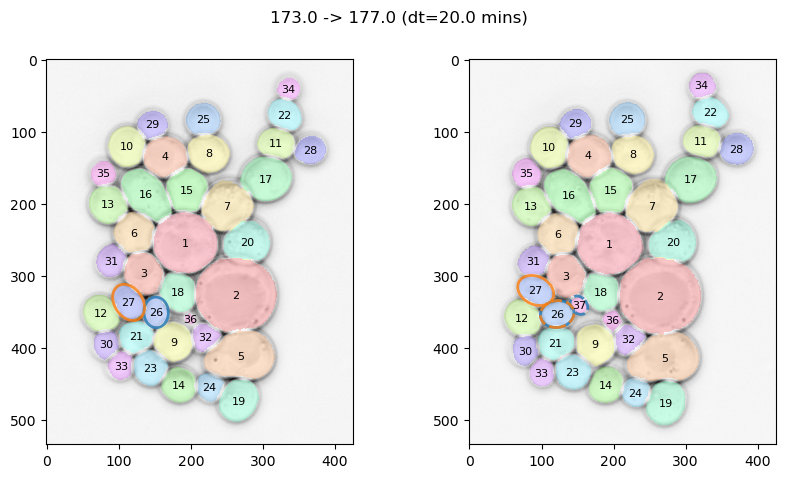

Expected 26->26, got 26->37
Expected 27->27, got 27->26


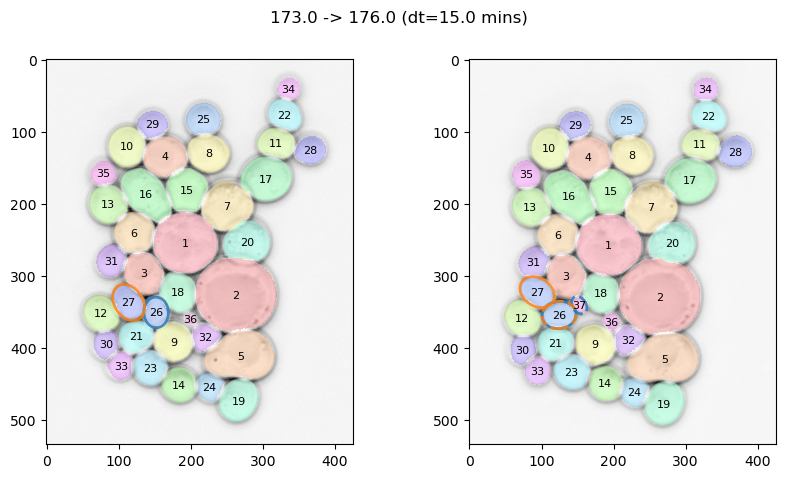

Expected 26->26, got 26->37
Expected 27->27, got 27->26


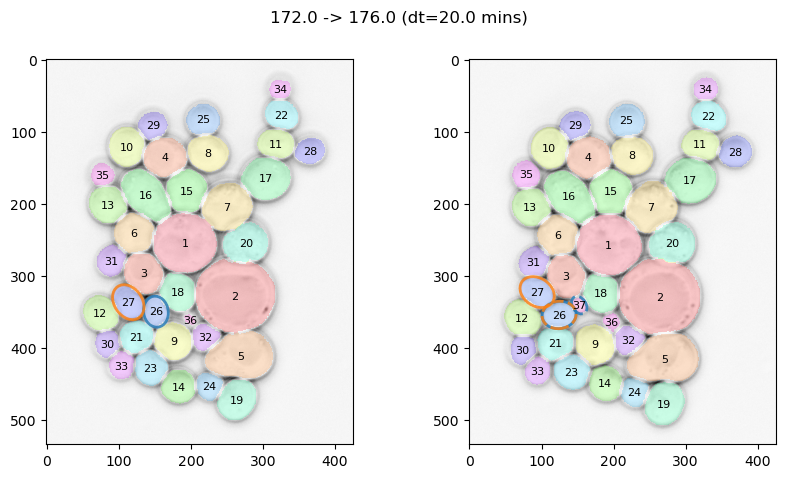

Expected 26->26, got 26->37
Expected 27->27, got 27->26


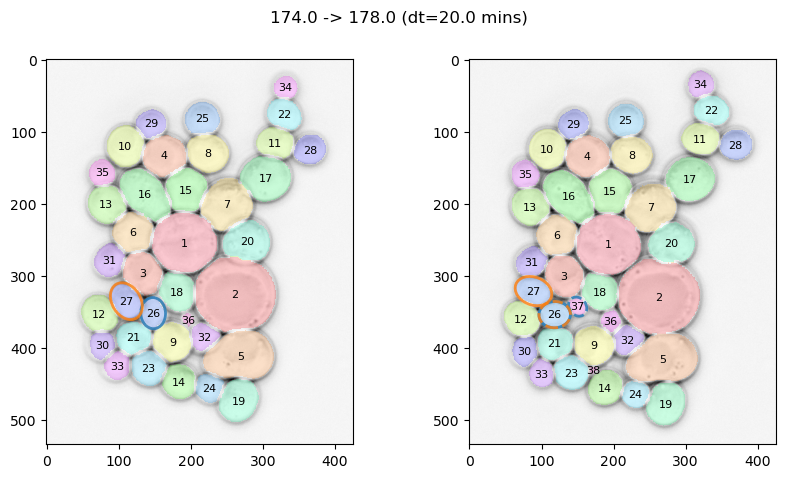

Expected 28->28, got 28->29


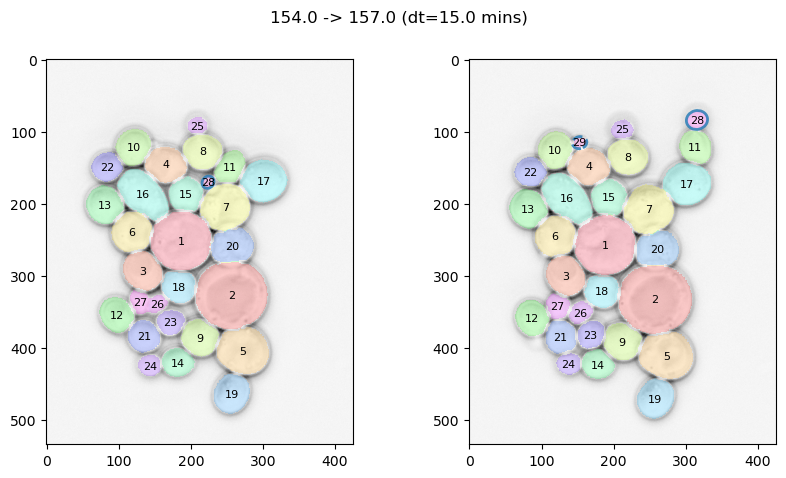

Expected 28->28, got 28->29


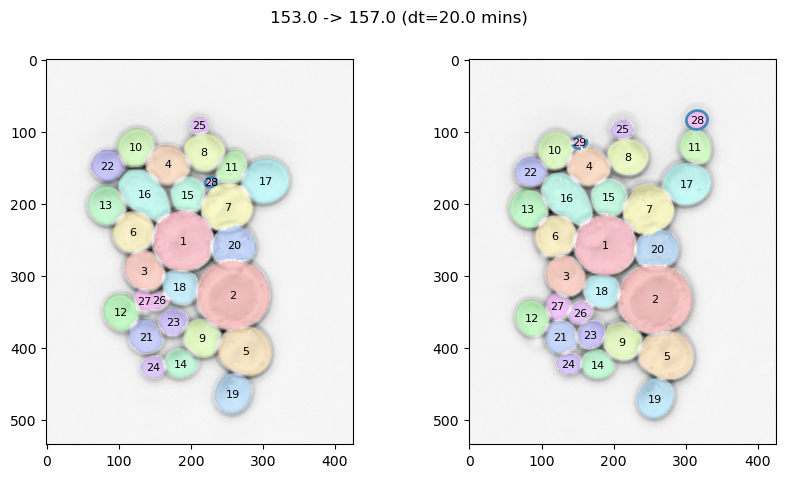

Expected 28->28, got 28->29


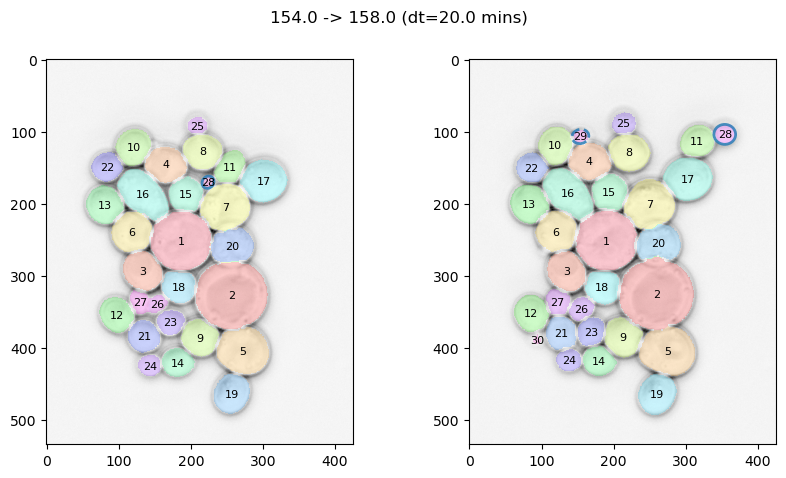

Expected 24->24, got 24->30


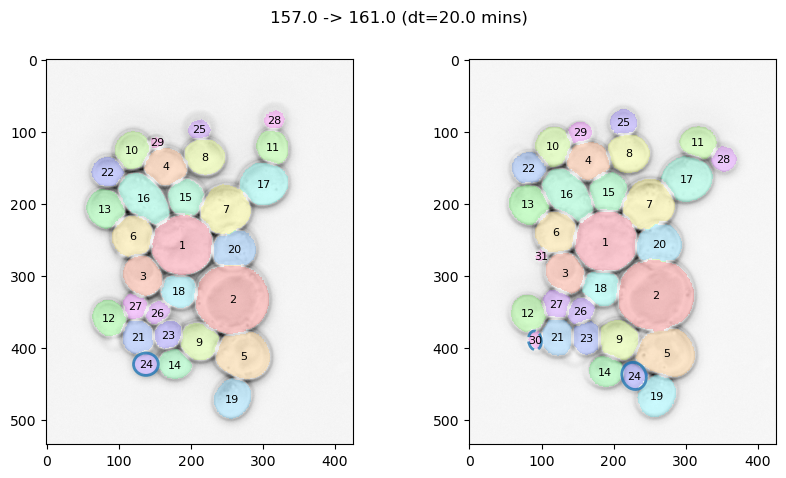

Expected 24->24, got 24->30


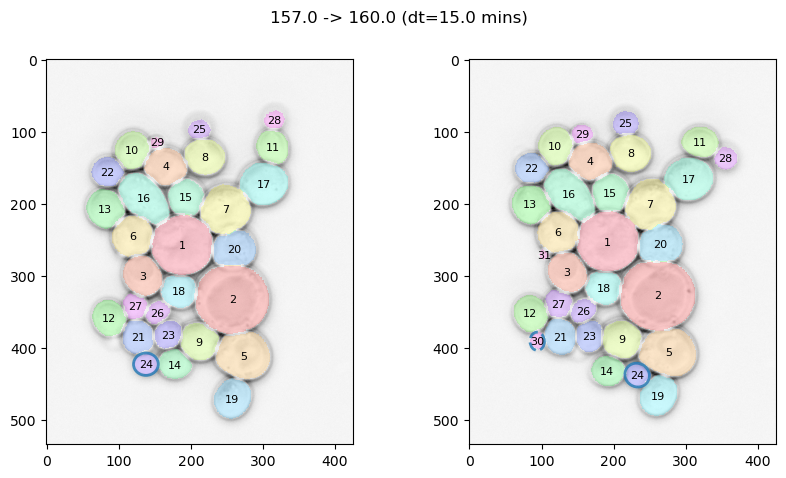

Expected 24->24, got 24->30


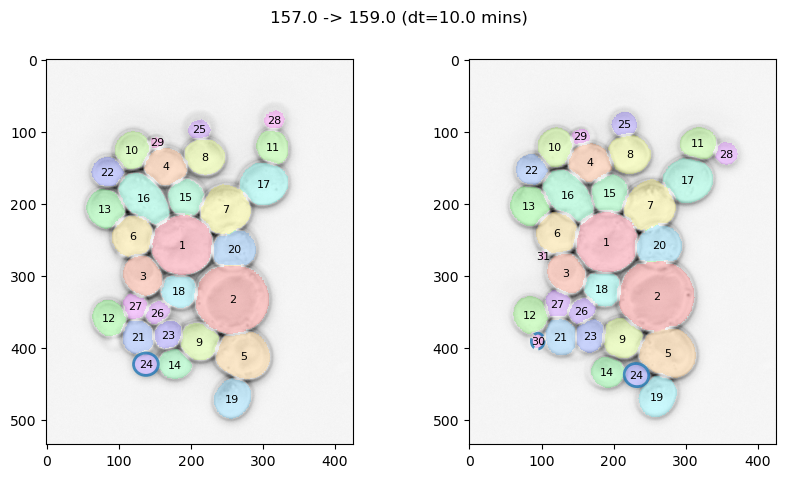

Expected 24->24, got 24->31


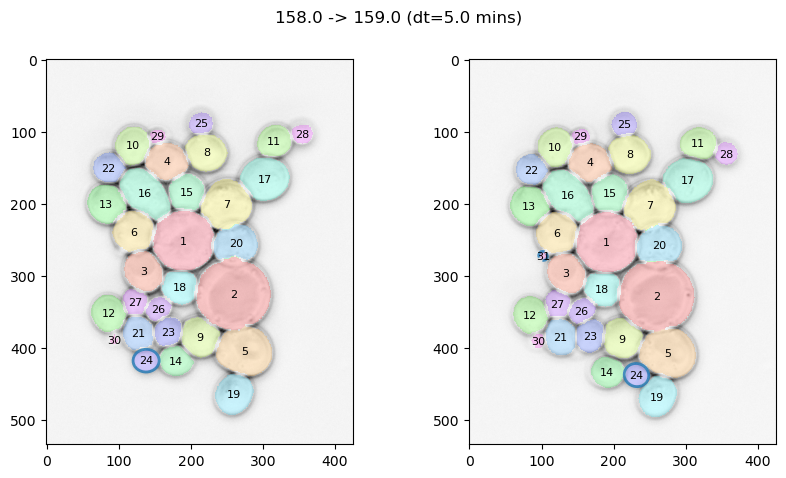

Expected 24->24, got 24->31


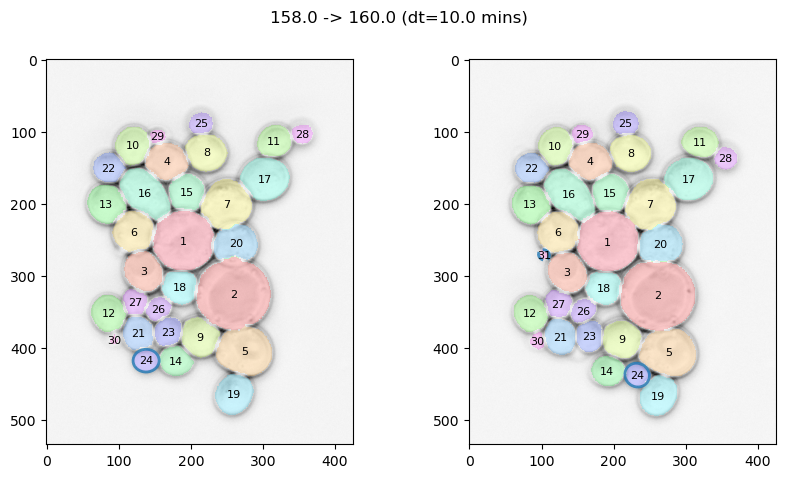

Expected 24->24, got 24->31


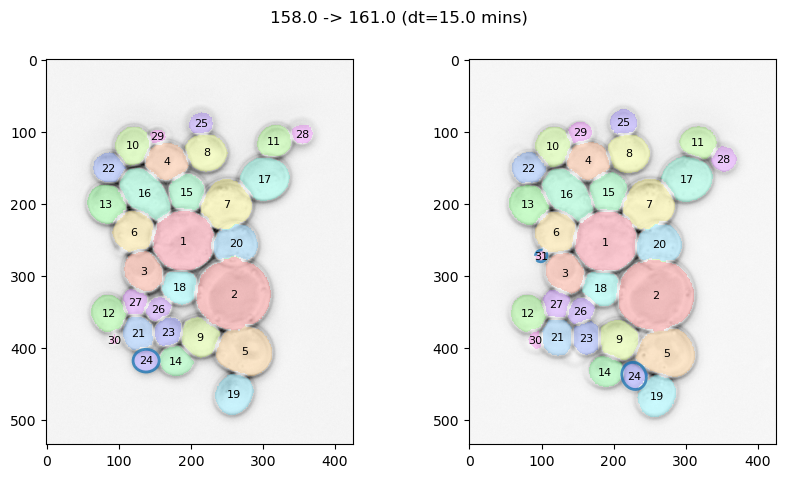

Expected 24->24, got 24->33


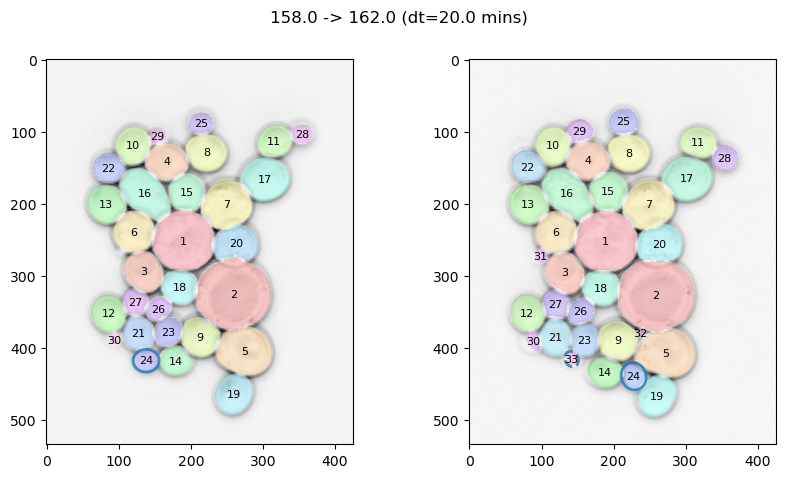

Expected 33->33, got 33->34


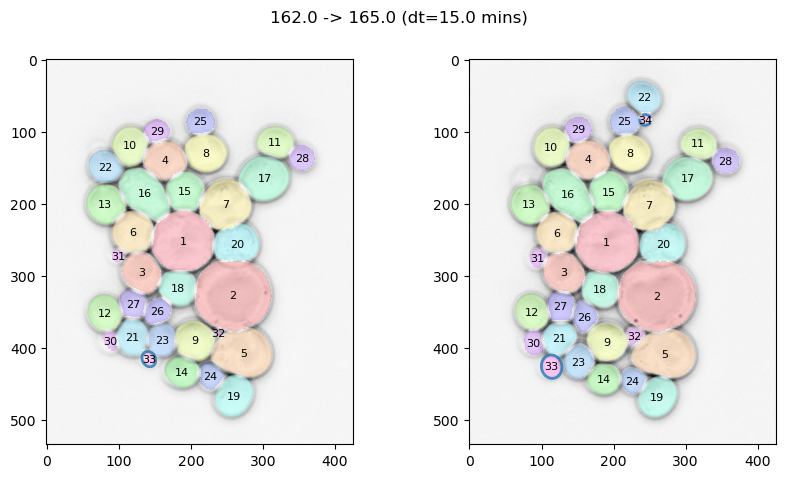

Expected 34->34, got 34->36


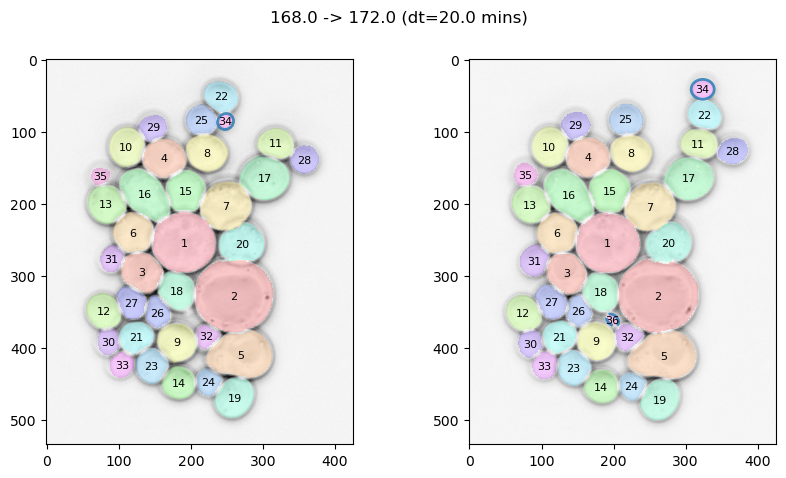

Expected 34->34, got 34->37


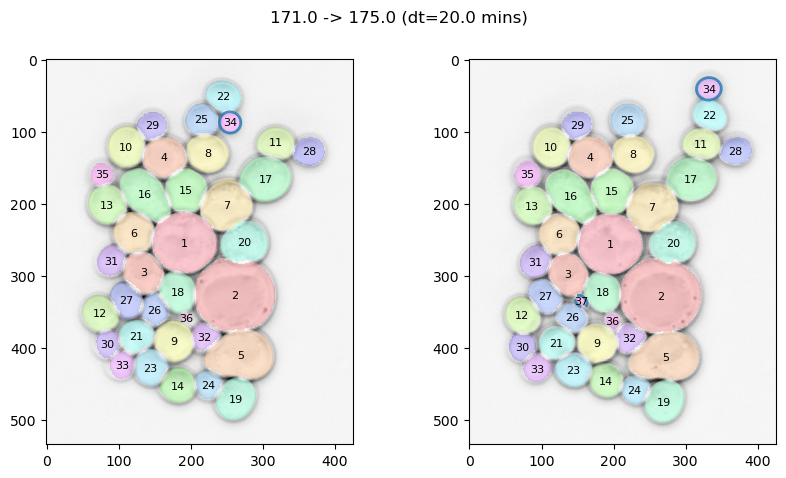

Expected 26->26, got 26->37


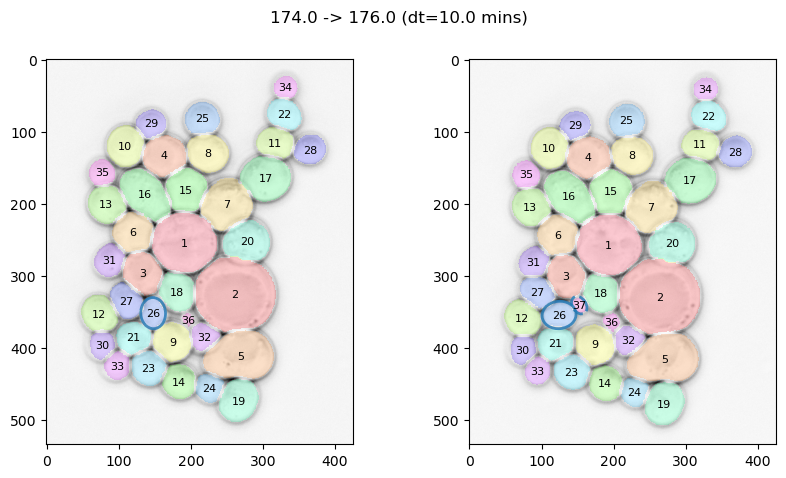

In [25]:
for _, row in res.query('(method == "gcn") and (fp > 0 or fn > 0)').sort_values('acc').iterrows():
    fig, axs = plt.subplots(ncols=2, figsize=(10, 5))
    vis.plot_visible(microscopy, int(row.t1), figax=(fig, axs[0]))
    vis.plot_segmentation(seg, int(row.t1), figax=(
        fig, axs[0]), cellids=True, alpha=0.2)
    vis.plot_visible(microscopy, int(row.t2), figax=(fig, axs[1]))
    vis.plot_segmentation(seg, int(row.t2), figax=(
        fig, axs[1]), cellids=True, alpha=0.2)
    fig.suptitle(f'{row.t1} -> {row.t2} (dt={row.timediff} mins)')
    ga = tracking.build_assgraph(tracking.build_cellgraph(
        feat, int(row.t1), cell_features=dataset_cell_features[1],
        edge_features=dataset_edge_features[0]), tracking.build_cellgraph(feat, int(row.t2), cell_features=dataset_cell_features[1],
                                                                          edge_features=dataset_edge_features[0]), include_target_feature=True)
    gat, *_ = tracking.to_data(ga)
    yhat = net.predict_assignment(gat)
    y = gat.y.cpu().numpy().reshape(yhat.shape)
    cellids1, cellids2 = seg.cell_ids(int(row.t1)), seg.cell_ids(int(row.t2))
    coloriter = iter(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    for idx1, (idx2, idx2_hat) in enumerate(zip(np.argmax(y, axis=1), np.argmax(yhat, axis=1))):
        if idx2 != idx2_hat:
            color = next(coloriter)
            print(
                f'Expected {cellids1[idx1]}->{cellids2[idx2]}, got {cellids1[idx1]}->{cellids2[idx2_hat]}')
            vis._vis._plot_ellipse(feat._ellipse(cellids1[idx1], int(row.t1)), figax=(
                fig, axs[0]), color=color, linewidth=2, alpha=0.8, draw_axes=False)
            vis._vis._plot_ellipse(feat._ellipse(cellids2[idx2], int(row.t2)), figax=(
                fig, axs[1]), color=color, linewidth=2, alpha=0.8, draw_axes=False)
            vis._vis._plot_ellipse(feat._ellipse(cellids2[idx2_hat], int(row.t2)), figax=(
                fig, axs[1]), color=color, linestyle='--', linewidth=2, alpha=0.8, draw_axes=False)
    plt.show()